# **3.0 Data Processing**

### **3.1 Importing Libraries** 

In [2]:
# For data manipulation
import numpy as np 
import pandas as pd 

# For data visualization
import matplotlib.pyplot as plt 
import seaborn as sns

# Ingore the warnings
import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import tensorflow
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory

# Other libraries
import os
import random


### **3.1 Loading Image Dataset from Directory**

In [3]:
# Load the image dataset from the directory using utils
# ds = image_dataset_from_directory('E:\DataScience Codanics\Kaggle\LAPTOP Items classification\PC Part Classification\Data')

train_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/d/atifaliak/flower-classification/Data//train',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

val_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/d/atifaliak/flower-classification/Data//val',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)


Found 13642 files belonging to 14 classes.
Found 98 files belonging to 14 classes.


### **3.2 Visualize the images**

In [4]:
# Creating a function to visualize the images

def visualize_images(path, num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    if not image_filenames:
        raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [5]:
# Extrating the class labels
classes = train_ds.class_names

ASTILBE


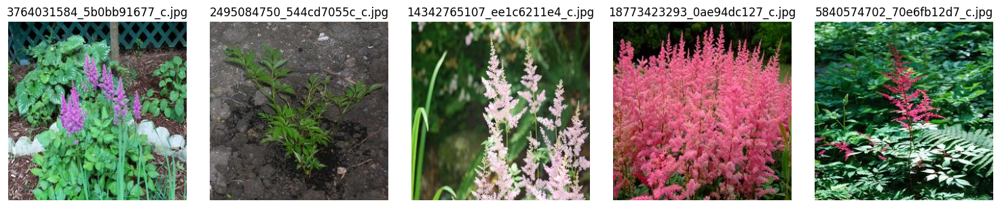

BELLFLOWER


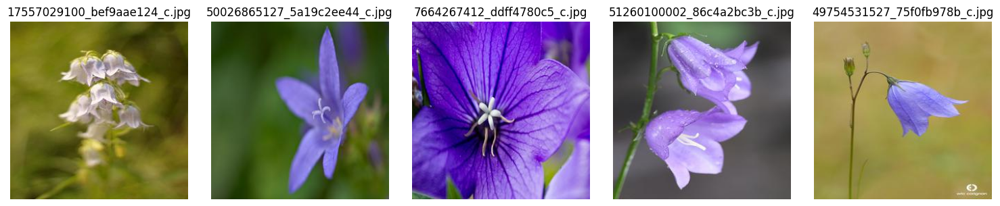

BLACK_EYED_SUSAN


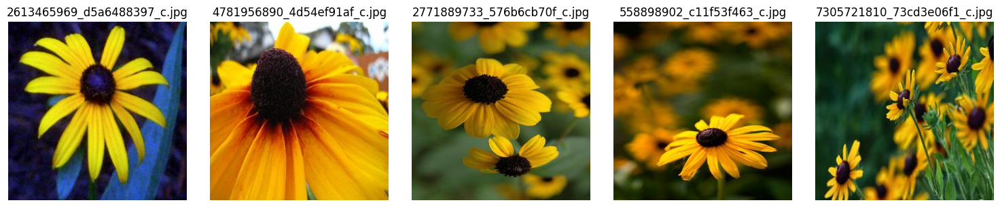

CALENDULA


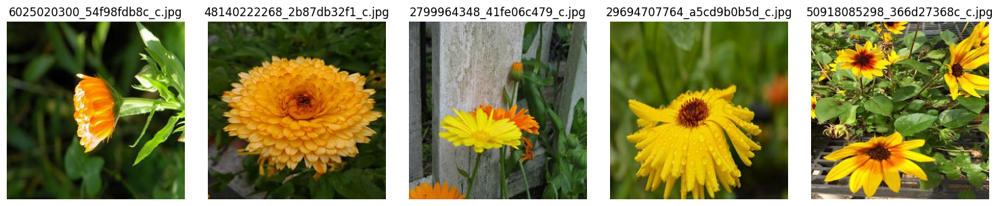

CALIFORNIA_POPPY


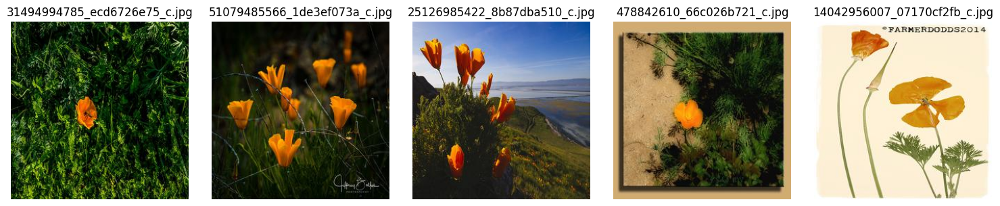

CARNATION


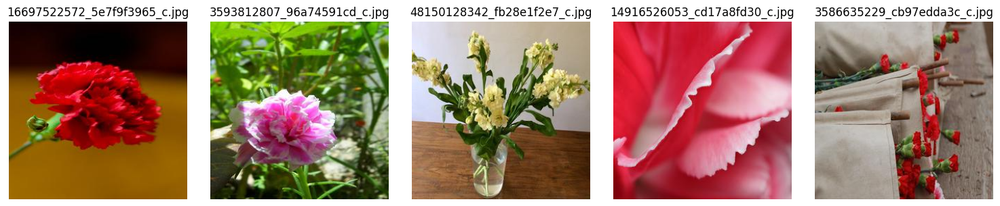

COMMON_DAISY


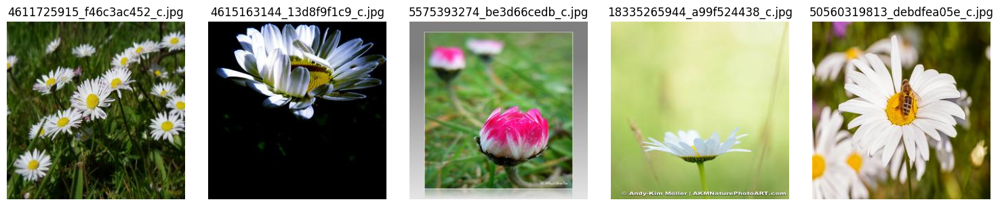

COREOPSIS


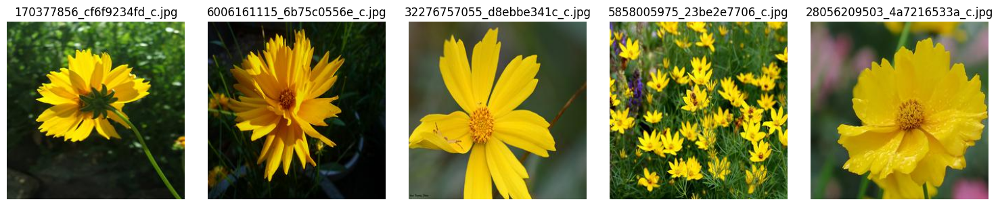

DANDELION


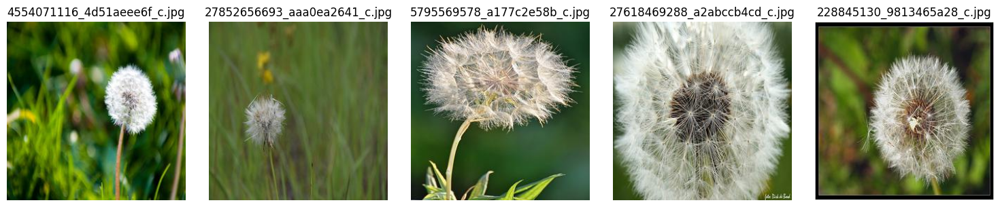

IRIS


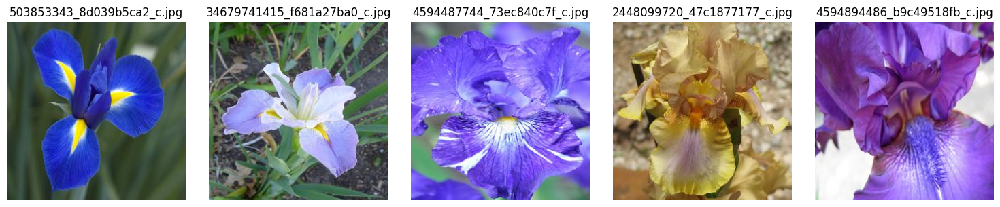

ROSE


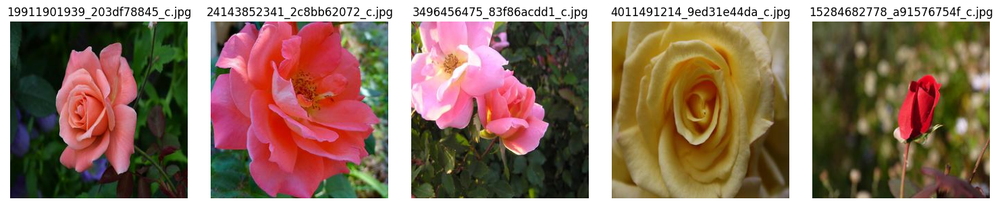

SUNFLOWER


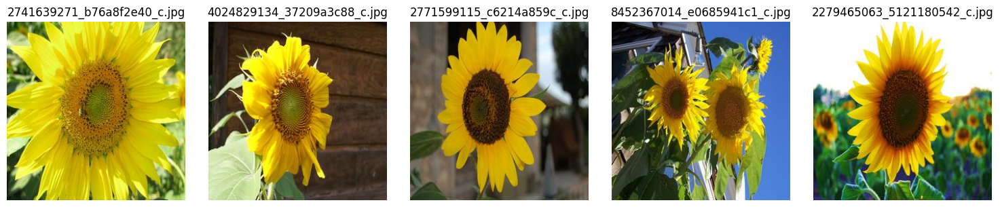

TULIP


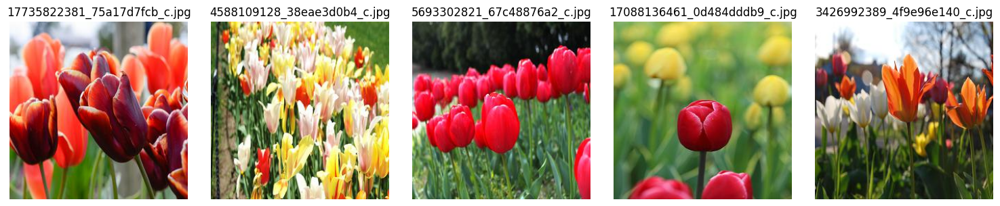

WATER_LILY


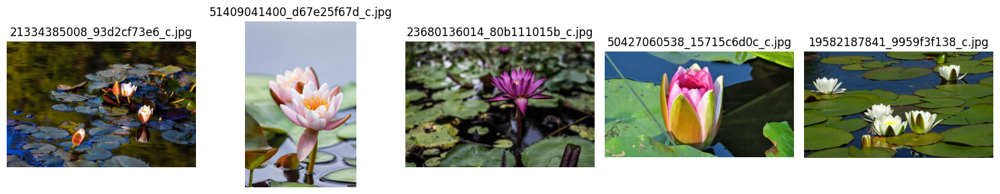

In [6]:
# Iterating through each class to plot its images
for label in classes:
    
    # Specify the path containing the images to visualize
    path_to_visualize = f"/kaggle/input/d/atifaliak/flower-classification/Data//train/{label}"

    # Visualize 5 random images
    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)

# **4.0 Modeling**

### **4.1 Model Building**

In [7]:
model = Sequential()

model.add(Conv2D(32, kernel_size=(3, 3),activation='relu', input_shape=(256,256,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Conv2D(64, kernel_size=(3, 3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(32, activation='relu'))

model.add(Dense(14, activation='softmax'))

In [8]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 254, 254, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 125, 125, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    62,980,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 14)             │           462 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,043,822 (240.49 MB)

 Trainable params: 63,043,630 (240.49 MB)

 Non-trainable params: 192 (768.00 B)

### **4.2 Model Compilation**

In [9]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

### **4.3 Model Training**

In [14]:
# Train the model

history = model.fit(train_ds, batch_size=32, epochs=30, validation_data=val_ds, verbose=1)

Epoch 1/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.0758 - loss: 2.6425 - val_accuracy: 0.0714 - val_loss: 2.6432
Epoch 2/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.0754 - loss: 2.6415 - val_accuracy: 0.0714 - val_loss: 2.6432
Epoch 3/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0806 - loss: 2.6374 - val_accuracy: 0.0714 - val_loss: 2.6431
Epoch 4/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0739 - loss: 2.6366 - val_accuracy: 0.0714 - val_loss: 2.6432
Epoch 5/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0737 - loss: 2.6355 - val_accuracy: 0.0714 - val_loss: 2.6432
Epoch 6/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0775 - loss: 2.6354 - val_accuracy: 0.0714 - val_loss: 2.6431
Epoch 7/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0788 - loss: 2.6367 - val_accuracy: 0.0714 - val_loss: 2.6431
Epoch 8/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.0762 - loss: 2.6356 - 

### **4.4 Plotting the Graph**

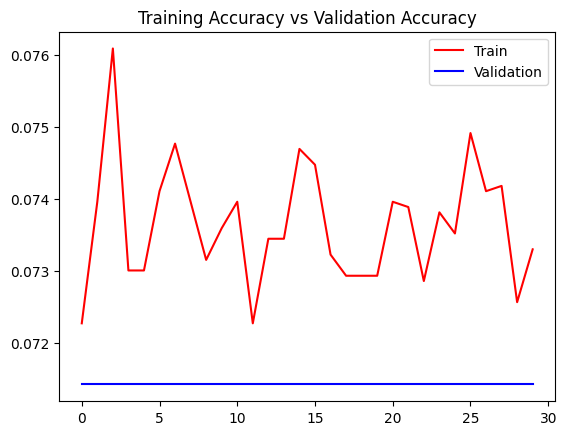

In [15]:
# Plotting the graph of Accuracy and Validation Accuracy
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()


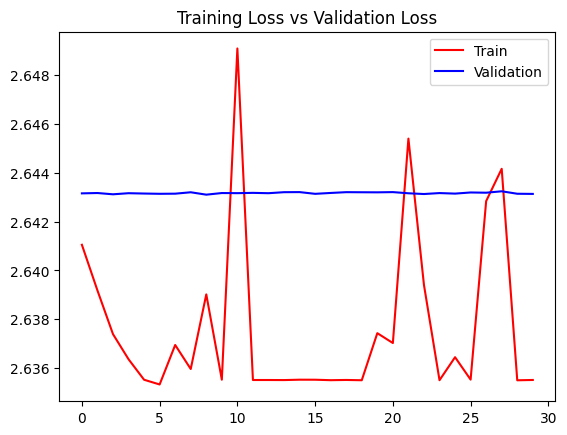

In [16]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()